### 1.0. Installing Scripts

In [1]:
!pip install segmentation-models torchvision torch opencv-python lightning scripts shapely segmentation_models_pytorch wandb weave tensorflow_hub

  Using cached opencv_python-4.12.0.88-cp37-abi3-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (19 kB)
  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Preparing metadata (setup.py) ... done
Using cached opencv_python-4.12.0.88-cp37-abi3-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (67.0 MB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 122.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.6/19.6 MB 170.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.1/677.1 kB 55.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 135.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 205.7 MB/s  0:00:00
  DEPRECATION: Building 'intervaltree' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behavio

In [2]:
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, random_split
import torch.nn.functional as F
from torchvision import transforms as T
import torch.nn as nn
import pytorch_lightning as pl
import os
import sys

from tqdm.notebook import tnrange, tqdm_notebook
import cv2
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

from shapely.geometry import Polygon
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import matplotlib.patches as mpatches
import wandb
from pytorch_lightning.loggers import WandbLogger
import weave

In [3]:
wandb.init(project='intreeligent-resnet34',name='resnet-34-otsu')

wandb: Currently logged in as: juanico-hernel064 (juanico-hernel064-university-of-science-and-technology-o) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


wandb: Initializing weave.
weave: Logged in as Weights & Biases user: juanico-hernel064.
weave: View Weave data at https://wandb.ai/juanico-hernel064-university-of-science-and-technology-o/intreeligent-resnet34/weave


wandb: WARNING Fatal error while uploading data. Some run data will not be synced, but it will still be written to disk. Use `wandb sync` at the end of the run to try uploading.


In [4]:
wandb.run.id

'nw1h4h2o'

### 1.1 Loading Packages

In [5]:
# Check what's in your actual scripts directory
scripts_dir = './scripts'
if os.path.exists(scripts_dir):
    print(f"Contents of {scripts_dir}:")
    for item in os.listdir(scripts_dir):
        print(f"  {item}")
    
    # Check for specific files
    tools_path = os.path.join(scripts_dir, 'tools.py')
    init_path = os.path.join(scripts_dir, '__init__.py')
    
    if os.path.exists(tools_path):
        print("✓ tools.py found")
    else:
        print("✗ tools.py NOT found!")
        
    if os.path.exists(init_path):
        print("✓ __init__.py found")
    else:
        print("✗ __init__.py missing - creating it...")
        with open(init_path, 'w') as f:
            f.write('# Local scripts package\n')
else:
    print(f"✗ Directory {scripts_dir} doesn't exist!")

Contents of ./scripts:
  custom_transforms.py
  tools.py
  utils.py
  .ipynb_checkpoints
  __pycache__
  visualize.py
  __init__.py
✓ tools.py found
✓ __init__.py found


In [6]:
#Clear the system scripts from Python's module cache
if 'scripts' in sys.modules:
    del sys.modules['scripts']

# Add your actual scripts directory to Python path
scripts_path = '/mnt/treecrownsv3'
sys.path.insert(0, scripts_path)

# Now import scripts - should get your local one
import scripts
print("Scripts module location:", scripts.__file__)
print("Scripts module contents:", dir(scripts))

# Now try importing tools
from scripts import tools
from scripts.visualize import BatchVisualizer as bv
from scripts import custom_transforms as CT

print("Successfully imported!")

Scripts module location: /mnt/custom-file-systems/efs/fs-0e7ab7755574f5cc4_fsap-08219cdc1d3638b18/scripts/__init__.py
Scripts module contents: ['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__']
Successfully imported!


### 1.2 Loading Root Directory

In [7]:
root = './Some-Trees-Dataset-10'
os.listdir(root)

['README.dataset.txt', 'test', 'valid', 'README.roboflow.txt', 'train']

### 2.0 Preparing Data

In [8]:
def load_img(img_path: str):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    return img

def generate_mask(idx, coco_jsonf, shape: tuple):
    reshaper = lambda x: np.array(x).reshape(len(x) // 2, 2)
    zeros = np.zeros(shape)

    img_df = pd.DataFrame(coco_jsonf['images'])
    ann_df = pd.DataFrame(coco_jsonf['annotations'])
    ann_df = ann_df[ann_df['image_id'] == idx]

    seg_points = ann_df['segmentation']
    coords = [reshaper(np.array(obj[0])).astype(np.int64) for obj in seg_points.to_numpy()]

    for obj, cls in zip(coords, ann_df['category_id']):
        cv2.fillPoly(zeros, [obj], cls)

    return zeros

In [9]:
class TreeDataset(Dataset):
    def __init__(self, root, subset, image_transform=None, mask_transform=None):
        self.root_dir = os.path.join(root, subset)
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.labels_name = [f for f in os.listdir(os.path.join(self.root_dir)) if f.endswith('.json')][0]
        self.coco_jsonf = json.load(open(os.path.join(self.root_dir, self.labels_name)))

    def __len__(self):
        return len(self.coco_jsonf['images'])

    def __getitem__(self, idx):
        img_name = None
        for img in self.coco_jsonf['images']:
            if img['id'] == idx:
                img_name = img['file_name']
                break

        if img_name is None:
            raise IndexError(f"Image with id {idx} not found in the dataset")

        img_path = os.path.join(self.root_dir, img_name)
        image = load_img(img_path)
        mask = generate_mask(idx, self.coco_jsonf, image.shape[:-1]).astype(np.int64)

        if self.image_transform and self.mask_transform:
            image = self.image_transform(image)
            mask = self.mask_transform(mask)
            return image, mask
        
        return image, mask

In [10]:
tools.set_seed(42)
img_trans = T.Compose([
    T.ToTensor(),
    T.Resize(size=(640, 640)),
    # CT.GaussianBlurTransform(),
    CT.AddOtsuChannel()
])

msk_trans = T.Compose([
    T.ToTensor(),
    T.Resize(size=(640, 640)),
])

train_set = TreeDataset(root, 'train', img_trans, msk_trans)
val_set = TreeDataset(root, 'valid', img_trans, msk_trans)
test_set = TreeDataset(root, 'test', img_trans, msk_trans)

In [11]:
tools.set_seed(42)
batch_size = 4
train_loader = DataLoader(train_set, shuffle=True, batch_size=batch_size, num_workers =4)
val_loader = DataLoader(val_set, shuffle=False, batch_size=batch_size, num_workers = 4)
test_loader = DataLoader(test_set, shuffle=False, batch_size=batch_size, num_workers=4)

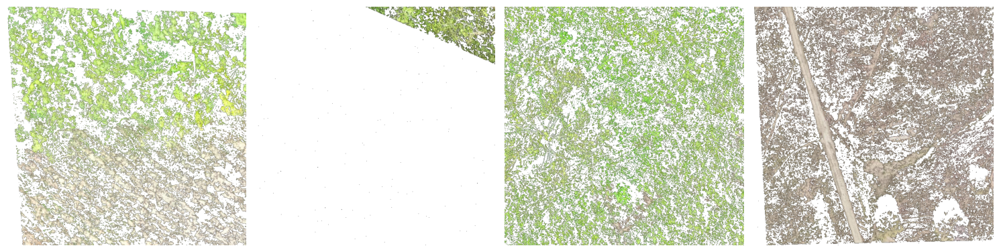

In [12]:
tools.set_seed(42)
x, y = next(iter(train_loader))

colors = {
    1: (255,0,0)
}

bv(task='image_segmentation').visualize_batch(x, y, subplot_dim=(1, 4), colors=colors, figsize=(15,15))

### 3.0 Setup Training 

In [16]:
import segmentation_models_pytorch as smp
import torchmetrics

In [17]:
wandb.config = {
    "architecture": "Unet",
    "encoder": "resnet34", 
    "input_channels": 3, 
    "output_classes": 1,
    "batch_size": 4,
    "learning_rate": 1e-3,
    "max_epochs": 90,
    "dataset": "Tree Crowns Segmentation",
    "with_filters": True
}

In [18]:
#Setting up WandbLogger
wandb_logger = WandbLogger(
    project="intreeligent-vanilla-resnet34",
    name="resnet-34-otsu",
    save_dir="./wandb_logs",
    log_model='all'
)

In [19]:
class LitSegmentation(pl.LightningModule):
    def __init__(self, arch="Unet", encoder="resnet34", in_channels=3, out_classes=2, lr=1e-3):
        super().__init__()
        self.save_hyperparameters()  

        # Model
        #Modify to accept extra dimension
        self.model = smp.create_model(
            arch,
            encoder_name=encoder,
            in_channels=in_channels,
            classes=out_classes,
        )

        # Loss
        self.loss_fn = smp.losses.DiceLoss(mode="multiclass" if out_classes > 1 else "binary")

        # Metrics
        task = "multiclass" if out_classes > 1 else "binary"
        self.train_acc = torchmetrics.Accuracy(task=task, num_classes=out_classes)
        self.val_acc = torchmetrics.Accuracy(task=task, num_classes=out_classes)
        self.val_iou = torchmetrics.JaccardIndex(task=task, num_classes=out_classes)
        self.test_acc = torchmetrics.Accuracy(task=task, num_classes=out_classes)
        self.test_iou = torchmetrics.JaccardIndex(task=task, num_classes=out_classes)

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, masks = batch
        logits = self(images)
        loss = self.loss_fn(logits, masks)

        # metrics
        self.train_acc(logits, masks)
        self.log("train_loss", loss, prog_bar=True, on_step=True, on_epoch=True)
        self.log("train_acc", self.train_acc, on_step=False, on_epoch=True, prog_bar=True)
        
        # Log learning rate
        self.log("learning_rate", self.trainer.optimizers[0].param_groups[0]['lr'], on_step=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, masks = batch
        logits = self(images)
        loss = self.loss_fn(logits, masks)

        # metrics
        self.val_acc(logits, masks)
        self.val_iou(logits, masks)
        self.log("val_loss", loss, prog_bar=True, on_epoch=True)
        self.log("val_acc", self.val_acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log("val_iou", self.val_iou, on_step=False, on_epoch=True, prog_bar=True)

    def test_step(self, batch, batch_idx):
        images, masks = batch
        logits = self(images)
        loss = self.loss_fn(logits, masks)

        # metrics
        self.test_acc(logits, masks)
        self.test_iou(logits, masks)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log("test_iou", self.test_iou, on_step=False, on_epoch=True, prog_bar=True)

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.hparams.lr)

In [20]:
sample_batch = next(iter(DataLoader(train_set, batch_size=1)))
input_channels = sample_batch[0].shape[1]

print(f"Input channels: {input_channels}")

model= LitSegmentation(in_channels=input_channels, out_classes=1)
print(f"Model initialized with {input_channels} input channels.")

Input channels: 4


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Model initialized with 4 input channels.


In [21]:
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

checkpoint_cb = ModelCheckpoint(
    monitor="val_iou", mode="max", save_top_k=1, filename="best-iou"
)
earlystop_cb = EarlyStopping(
    monitor="val_iou", patience=10, mode="max"
)

trainer = pl.Trainer(
    max_epochs=90,
    accelerator="auto",
    devices=1,
    log_every_n_steps=10,
    logger=wandb_logger,
    # callbacks=[
    #     pl.callbacks.ModelCheckpoint(monitor="val_loss", save_top_k=1, mode="min"),
    #     pl.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    # ]
)

wandb_logger.watch(model, log='all', log_freq=100)

# trainer.fit(model, train_loader, val_loader)

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/opt/conda/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:397: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
wandb: logging graph, to disable use `wandb.watch(log_graph=False)`


### 3.0 Testing Model

In [22]:
model.load_state_dict(torch.load('./resnet_34_filtered/segmentation_model_resnet34_otsu.pth', weights_only=True))

<All keys matched successfully>

In [29]:
def test_model(model, test_loader, device="cuda" if torch.cuda.is_available() else "cpu"):
    """
    Run inference on the test_loader and return predictions.

    Args:
        model (pl.LightningModule): Trained Lightning model.
        test_loader (DataLoader): Test DataLoader.
        device (str): 'cuda' or 'cpu'.

    Returns:
        list: Predictions, one entry per batch in test_loader.
    """
    model.eval()
    model.to(device)

    inputs = []
    truths = []
    preds = []
    with torch.no_grad():
        for batch in test_loader:
            inputs.append(batch[0])
            truths.append(batch[1])

            images = batch[0].to(device)
            logits = model(images)

            # Convert logits to class predictions
            if logits.shape[1] > 1:  # multiclass
                pred = torch.argmax(logits, dim=1)
            else:  # binary
                pred = (torch.sigmoid(logits) > 0.5).long()

            preds.append(pred.cpu())

    return inputs, truths, preds

In [30]:
inputs, truths, preds = test_model(model, test_loader)

**Ground Truth**

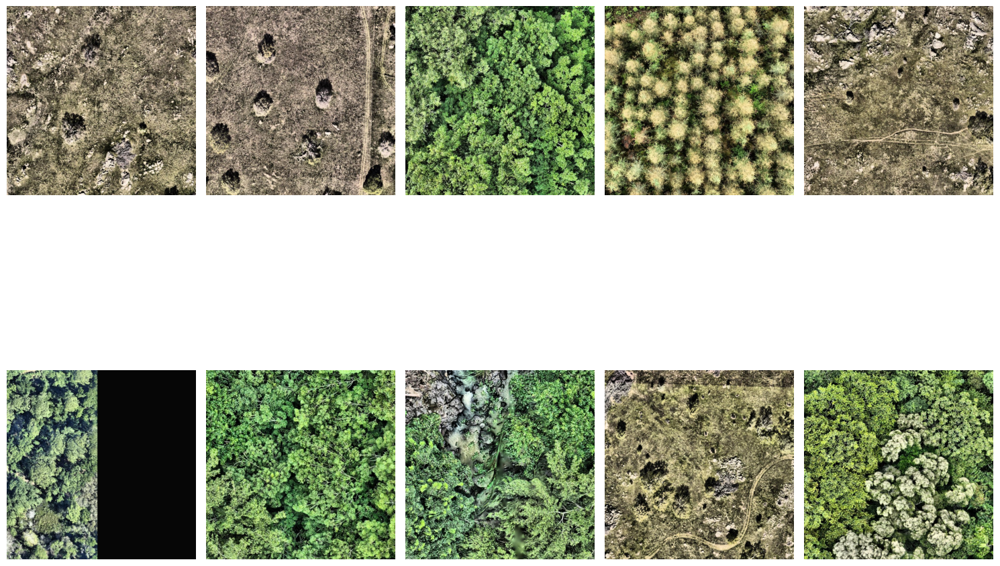

In [31]:
inputs_tensor = torch.concat(inputs)
inputs_rgb = inputs_tensor[:, :3, :, :]
bv(task='image_segmentation').visualize_batch(inputs_rgb, torch.concat(truths), subplot_dim=(2, 5), figsize=(15,15), colors=colors)

**Predicted**

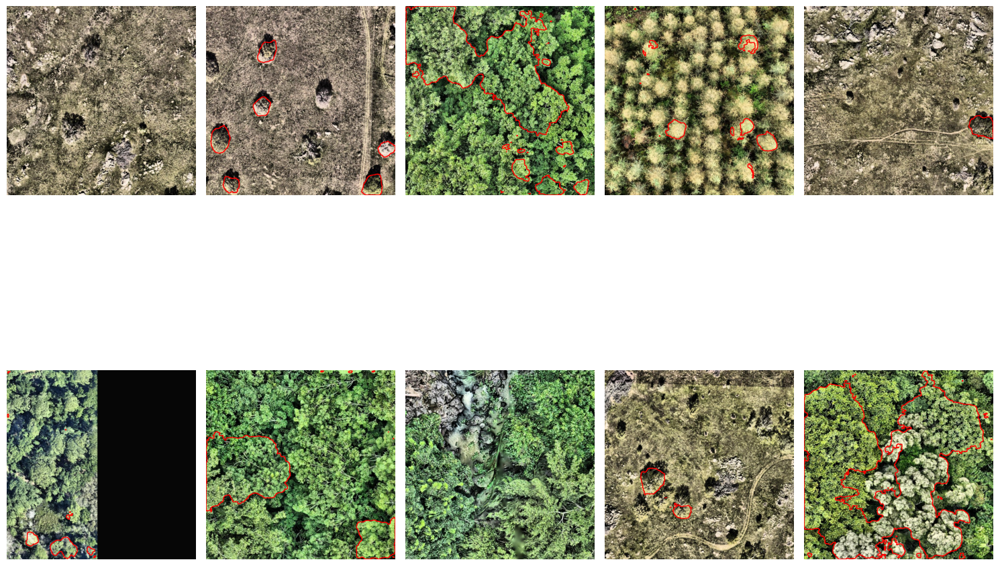

In [28]:
bv(task='image_segmentation').visualize_batch(inputs_rgb, torch.concat(preds), subplot_dim=(2, 5), figsize=(15,15), colors=colors)

### Exporting Model for Retraining/Use

In [25]:
# 1. Save full Lightning checkpoint (resume training later)
trainer.save_checkpoint(str(root) + "segmentation_model_resnet34_filter.ckpt")
print("✅ Saved Lightning checkpoint -> segmentation_model.ckpt")

# 2. Save only underlying PyTorch model weights (for inference)
torch.save(model.model.state_dict(), str(root) + "segmentation_model_resnet34_filter.pth")
print("✅ Saved raw PyTorch weights -> segmentation_model.pth")

✅ Saved Lightning checkpoint -> segmentation_model.ckpt
✅ Saved raw PyTorch weights -> segmentation_model.pth


### Visualize Latest Training

In [30]:
trained_model = LitSegmentation.load_from_checkpoint('./resnet_34_vanilla/latest_checkpoint.ckpt')
inputs, truths, preds = test_model(model, test_loader)

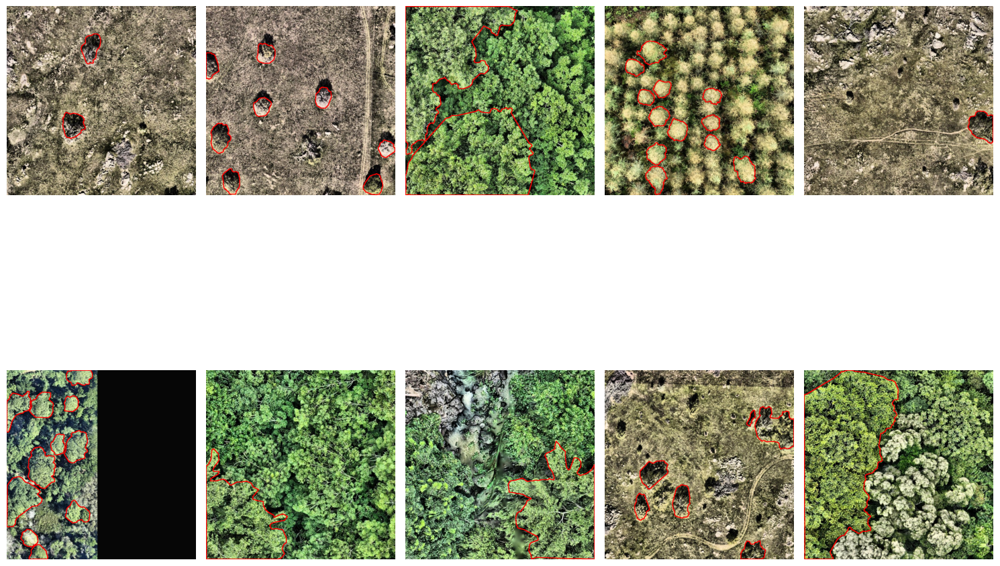

In [34]:
bv(task='image_segmentation').visualize_batch(torch.concat(inputs), torch.concat(truths), subplot_dim=(2, 5), figsize=(15,15), colors=colors)

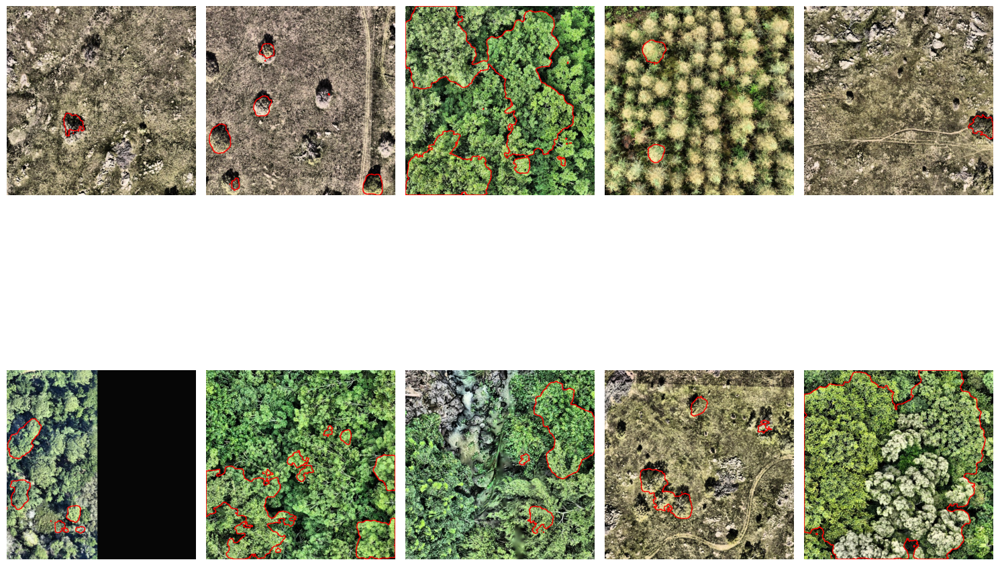

In [35]:
bv(task='image_segmentation').visualize_batch(torch.concat(inputs), torch.concat(preds), subplot_dim=(2, 5), figsize=(15,15), colors=colors)

In [26]:
#finally save the model and the checkpoint
trainer.save_checkpoint('./resnet_34_filtered/latest_checkpoint.ckpt')
torch.save(model.state_dict(), './resnet_34_filtered/segmentation_model_resnet34_otsu.pth')